In [0]:
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans
import pandas as pd  
import seaborn as sns 

%matplotlib inline
import sklearn
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


**Load the dataset**


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
X_train = pd.read_csv('/content/drive/My Drive/CS267 Project Data/train.csv')

In [0]:
X_train.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

# **Feature Selection**

In [0]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

I = X_train.iloc[:,0:20]
T = X_train.iloc[:,-1]

**Apply SelectKBest class to extract top 5 best features**

In [0]:
bestfeatures = SelectKBest(score_func=chi2, k=5)
fit = bestfeatures.fit(I,T)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(I.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(5,'Score')) 

            Specs          Score
13            ram  931267.519053
11      px_height   17363.569536
0   battery_power   14129.866576
12       px_width    9810.586750
8       mobile_wt      95.972863


**Feature Importance**

In [0]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(I,T)
print(model.feature_importances_)


[0.05906695 0.02017222 0.03388785 0.01952861 0.0325116  0.01766447
 0.03656684 0.0341184  0.03639014 0.03406586 0.03408761 0.04724598
 0.04784271 0.38946124 0.03427315 0.03451365 0.03459852 0.01473644
 0.01882378 0.020444  ]


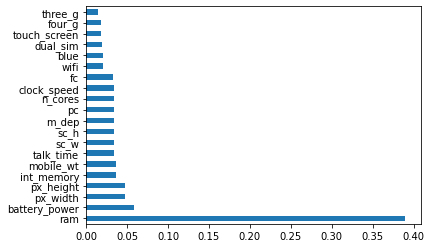

In [0]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=I.columns)
feat_importances.nlargest(21).plot(kind='barh')
plt.show()

**Correlation Matrix with Heatmap**

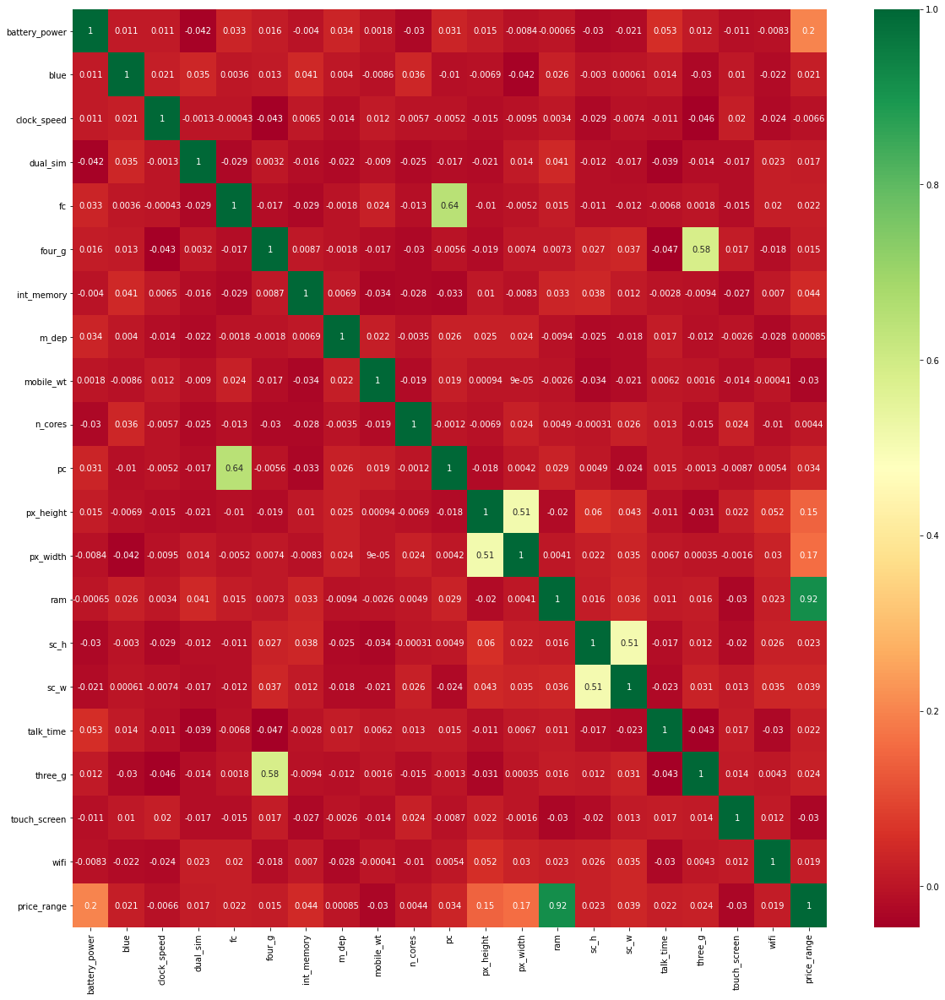

In [0]:
import seaborn as sns

#get correlations of each features in dataset
corrmat = X_train.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(X_train[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# **K-Means Clustering Algorithm**

## **Fit the training data into the K-Means Model**

In [0]:
km = KMeans(n_clusters=4, max_iter=3000000, random_state=0).fit(X_train)
pred = km.labels_
print(pred)

[0 3 3 ... 2 1 2]


In [0]:
X_train['cluster'] = km.labels_
X_train.sort_values('cluster')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range,cluster
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1,0
462,1986,0,0.5,1,3,1,51,0.1,165,8,20,282,1358,1614,17,12,3,1,1,1,1,0
461,1512,1,1.7,0,12,0,6,0.7,162,7,17,205,884,2335,15,7,7,1,1,1,2,0
460,1742,0,2.3,1,9,1,43,0.4,170,7,12,453,681,2610,12,3,10,1,0,1,2,0
455,1747,1,0.9,0,6,1,48,0.7,94,3,19,947,1131,2362,17,2,19,1,1,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
689,705,1,0.5,0,5,1,57,0.9,155,6,9,1114,1374,1509,15,11,18,1,1,1,1,3
1592,826,0,0.6,0,3,0,62,0.7,187,4,19,778,1615,1998,17,4,17,0,0,0,1,3
1588,1880,1,2.0,0,11,0,35,0.1,200,4,14,930,1983,1930,17,7,15,0,1,0,2,3
649,709,1,2.0,1,0,0,35,0.1,136,1,0,1545,1596,1973,12,9,16,0,1,1,1,3


In [0]:
ct = pd.crosstab(X_train['cluster'],X_train['price_range'])
ct

price_range,0,1,2,3
cluster,,,,
0,15,219,231,8
1,477,125,0,0
2,0,0,138,461
3,8,156,131,31


**Clustering the mobile in classification**

In [0]:

centers = X_train.groupby('cluster').mean()
centers

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
cluster,,,,,,,,,,,,,,,,,,,,,
0,1238.306554,0.511628,1.512685,0.511628,4.475687,0.536998,31.790698,0.485201,137.520085,4.562368,10.270613,396.086681,1006.923890,2275.668076,12.230444,5.845666,11.355180,0.788584,0.496829,0.498943,1.490486
1,1238.865449,0.480066,1.555482,0.478405,4.189369,0.521595,31.171096,0.498173,140.614618,4.503322,9.677741,560.619601,1193.182724,841.591362,12.257475,5.553156,10.712625,0.742525,0.518272,0.493355,0.207641
2,1240.761269,0.509182,1.520868,0.550918,4.355593,0.520868,32.943239,0.499499,141.504174,4.475793,10.008347,645.048414,1283.769616,3438.121870,12.327212,5.863105,10.943239,0.749583,0.492487,0.519199,2.769616
3,1234.064417,0.472393,1.477301,0.487730,4.205521,0.500000,32.386503,0.536503,141.226994,4.573620,9.674847,1162.546012,1654.852761,1858.779141,12.469325,5.871166,11.187117,0.779141,0.503067,0.521472,1.567485


# **Battery vs Price**

Text(0, 0.5, 'Ram')

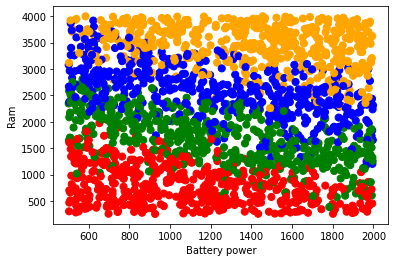

In [0]:
colors = np.array(['red','green','blue','orange'])
plt.scatter(X_train['battery_power'],X_train['ram'], c=colors[X_train.price_range], s=50)
# plt.scatter(centers.income,centers.spending,linewidths=3, marker='+', s=300, c='black')
plt.xlabel('Battery power')
plt.ylabel('Ram')

### **RAM vs Price range**

Text(0, 0.5, 'RAM')

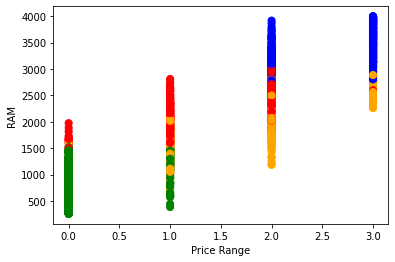

In [0]:
colors = np.array(['red','green','blue','orange'])
plt.scatter(X_train['price_range'],X_train['ram'], c=colors[X_train.cluster], s=50)
# plt.scatter(centers.income,centers.spending,linewidths=3, marker='+', s=300, c='black')
plt.xlabel('Price Range')
plt.ylabel('RAM')

In [0]:
from sklearn import metrics
metrics.silhouette_score(X_train, km.labels_)

0.2661228835514971

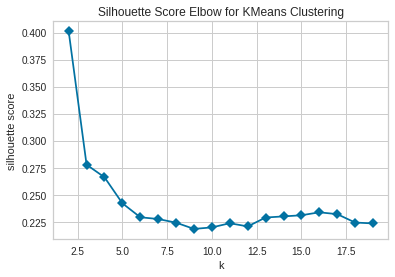

In [0]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(random_state=0)
visualizer = KElbowVisualizer(model, k=(2,20), metric='silhouette', timings=False)
visualizer.fit(X_train)    
visualizer.poof() 

In [0]:
X_test = pd.read_csv('/content/drive/My Drive/CS267 Project Data/test.csv')

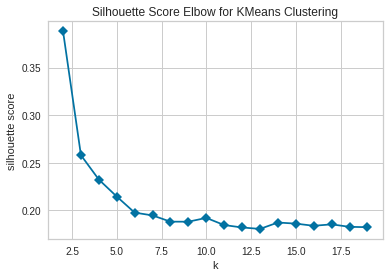

In [0]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(random_state=0)
visualizer = KElbowVisualizer(model, k=(2,20), metric='silhouette', timings=False)
visualizer.fit(X_test)    
visualizer.poof() 

### **Fit the model on the Testing Data**

In [0]:
km1=KMeans(n_clusters=4,random_state=1, max_iter=30000).fit(X_test)

In [0]:
# X_test = X_test.drop(columns=['id'])
X_test['cluster']=km1.labels_
X_test.sort_values('cluster')

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,cluster
393,394,904,0,2.4,0,5,1,55,0.6,158,4,13,529,764,2008,6,1,16,1,0,0,0
737,738,1341,0,1.4,0,8,1,38,1.0,170,5,10,601,937,1579,16,4,19,1,0,1,0
488,489,1859,0,0.5,0,0,1,52,1.0,187,1,2,651,966,1604,15,12,10,1,0,0,0
735,736,1181,1,1.6,1,5,1,32,0.2,181,1,16,450,623,1435,11,10,13,1,1,0,0
329,330,803,1,2.2,1,0,0,16,0.1,105,1,0,199,736,1492,17,12,18,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
780,781,1986,0,0.8,0,5,1,13,0.2,108,8,7,757,1962,1190,7,5,17,1,1,0,3
276,277,1744,1,0.9,1,5,1,35,0.3,137,7,9,915,1554,656,17,4,7,1,0,0,3
559,560,1457,0,0.5,1,7,0,8,0.3,120,7,13,786,1032,584,13,4,10,1,0,0,3
772,773,1363,1,2.6,1,1,1,39,0.2,129,5,2,550,1248,267,6,1,15,1,1,0,3


In [0]:
predicted_price = km1.fit_predict(X_test)
predicted_price

In [0]:
centers = X_test.groupby('cluster').mean()
centers

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
cluster,,,,,,,,,,,,,,,,,,,,,
0,504.669492,1232.139831,0.516949,1.526271,0.470339,4.614407,0.470339,34.228814,0.519492,140.093220,4.466102,10.038136,376.322034,938.800847,1788.516949,12.110169,5.381356,11.135593,0.741525,0.567797,0.542373
1,459.419795,1218.822526,0.556314,1.534130,0.552901,4.368601,0.467577,33.737201,0.502048,139.921502,4.225256,9.597270,518.546075,1117.843003,3395.737201,12.037543,5.187713,11.047782,0.757679,0.457338,0.474403
2,546.490385,1287.860577,0.480769,1.596635,0.538462,4.418269,0.576923,32.418269,0.544712,141.163462,4.235577,10.442308,1008.807692,1614.514423,2527.543269,11.923077,5.831731,11.206731,0.812500,0.490385,0.500000
3,506.152091,1265.152091,0.498099,1.517490,0.501901,4.961977,0.452471,34.015209,0.511407,137.224335,4.391635,10.269962,671.266160,1349.315589,746.114068,11.901141,4.992395,10.984791,0.722433,0.494297,0.517110


### **Prediction of the mobile price**

In [0]:
predicted_price = km.fit_predict(X_test)

predicted_price

array([1, 1, 2, 1, 0, 1, 1, 3, 1, 3, 1, 1, 3, 3, 2, 3, 0, 0, 1, 0, 3, 1,
       0, 0, 1, 3, 0, 3, 1, 3, 2, 3, 2, 3, 3, 0, 1, 0, 1, 0, 3, 1, 3, 3,
       3, 3, 0, 2, 0, 1, 0, 3, 2, 0, 1, 0, 2, 3, 0, 1, 1, 1, 0, 0, 0, 0,
       3, 2, 0, 2, 0, 2, 1, 1, 1, 3, 1, 3, 0, 1, 0, 1, 1, 3, 1, 3, 1, 0,
       1, 3, 0, 0, 1, 3, 1, 0, 3, 2, 0, 1, 0, 3, 3, 2, 0, 0, 3, 0, 1, 1,
       1, 1, 0, 1, 2, 1, 1, 0, 1, 3, 3, 1, 1, 0, 0, 3, 1, 1, 2, 3, 3, 2,
       0, 0, 2, 0, 0, 3, 1, 2, 0, 1, 0, 2, 1, 2, 1, 1, 2, 1, 1, 1, 3, 0,
       2, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 3, 3, 2, 3, 3, 3, 2, 3, 3, 2,
       0, 3, 0, 0, 3, 3, 3, 3, 1, 2, 2, 3, 3, 3, 3, 3, 3, 1, 0, 3, 2, 2,
       2, 1, 0, 1, 1, 1, 1, 2, 2, 3, 3, 0, 0, 2, 0, 2, 1, 2, 3, 1, 3, 1,
       1, 1, 2, 3, 3, 3, 3, 1, 3, 0, 3, 1, 2, 3, 1, 3, 1, 3, 1, 0, 2, 3,
       3, 1, 0, 1, 2, 1, 2, 0, 1, 3, 3, 1, 1, 1, 2, 1, 0, 3, 1, 2, 0, 1,
       1, 1, 1, 0, 3, 0, 0, 1, 2, 0, 1, 2, 3, 1, 0, 0, 2, 3, 3, 1, 2, 1,
       1, 1, 0, 1, 2, 0, 1, 0, 2, 3, 0, 0, 1, 1, 0,

# **Random Forest**

In [0]:
from sklearn.ensemble import RandomForestClassifier

**Load Dataset**

In [0]:
dataset = pd.read_csv('/content/drive/My Drive/CS267 Project Data/train.csv')
X_train = dataset.drop(columns=['price_range'], axis=0)
y_train = dataset['price_range']


## **Fit the training dataset to the Random Forest Classifier**

In [0]:
model = RandomForestClassifier(n_estimators=200)
model.fit(X_train, y_train)
model.feature_importances_

array([0.07543197, 0.00665487, 0.02672016, 0.00678709, 0.02449825,
       0.00646258, 0.0366018 , 0.0239743 , 0.03848247, 0.02329595,
       0.0291141 , 0.05695168, 0.05814016, 0.48509181, 0.02642029,
       0.02775476, 0.02884004, 0.00563323, 0.00690067, 0.00624383])

In [0]:
dataset_test = pd.read_csv('/content/drive/My Drive/CS267 Project Data/test.csv')
X_test = dataset_test.drop(columns=['id'])

In [0]:
y_pred = model.predict(X_test)
y_pred

array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 2, 0, 2, 0, 3, 0, 0, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 2, 0, 3, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 1, 1, 1,
       1, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 0, 2, 1, 0, 2, 1, 2, 1, 0, 0, 3, 1, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 1, 3, 0, 0, 3, 2, 1, 1, 0, 3, 2, 3, 1, 0, 2,
       1, 1, 3, 1, 2, 0, 3, 2, 1, 3, 1, 2, 2, 3, 3, 2, 2, 3, 2, 3, 0, 0,
       3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 2, 1, 0, 0, 1, 2, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       2, 3, 1, 2, 3, 3, 3, 1, 2, 1, 0, 0, 1, 3, 0, 2, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 0, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 3, 0, 2, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 1, 2, 3, 1, 1, 3, 2, 0, 3, 0, 1, 2, 0, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 2, 2, 1, 1, 0, 2, 3, 1,

## **Tree Visualization**

In [0]:
feature_names=['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi']

In [0]:
from sklearn.tree import export_graphviz
estimator = model.estimators_[5]
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = feature_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [0]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [0]:
from IPython.display import Image
Image(filename = 'tree.png')

# **Random Forest with Feature Selection**

In [0]:
dataset_train = dataset = pd.read_csv('/content/drive/My Drive/CS267 Project Data/train.csv')
X_train1 = dataset_train.drop(columns=['blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'm_dep', 'mobile_wt', 'n_cores', 'pc',
       'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'], axis=0)
y_train1 = dataset['price_range']
X_train1.columns
y_train1 = dataset['price_range']

In [0]:
dataset_test = pd.read_csv('/content/drive/My Drive/CS267 Project Data/test.csv')
X_test1 = dataset_test.drop(columns=['blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'm_dep', 'mobile_wt', 'n_cores', 'pc',
       'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'id'])
X_test1.columns

Index(['battery_power', 'int_memory', 'px_height', 'px_width', 'ram'], dtype='object')

In [0]:
model_fs = RandomForestClassifier(n_estimators=200)
model_fs.fit(X_train1, y_train1)
model_fs.feature_importances_

array([0.11718875, 0.04099258, 0.081151  , 0.07948399, 0.68118369])

In [0]:
y_pred1 = model_fs.predict(X_test1)
y_pred1

array([3, 3, 3, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 0, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 3, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 2, 1, 1,
       1, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 1, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 0, 2, 2, 0, 2, 1, 2, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 2, 1, 2, 0, 3, 2, 3, 1, 0, 2,
       1, 1, 3, 1, 1, 0, 3, 2, 1, 3, 1, 3, 2, 3, 3, 2, 2, 3, 2, 3, 1, 0,
       3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       0, 0, 1, 2, 1, 0, 0, 1, 2, 2, 2, 1, 0, 0, 0, 1, 0, 3, 2, 0, 2, 2,
       2, 3, 1, 2, 3, 2, 3, 2, 2, 1, 0, 0, 1, 2, 0, 3, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 2, 1, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 1, 2, 3, 2, 1, 3, 2, 0, 3, 0, 1, 2, 0, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 2, 2, 1, 2, 0, 2, 3, 1,

## **Tree Visualization with feature selection**

In [0]:
feature_names1 = ['battery_power', 'int_memory', 'px_height', 'px_width', 'ram']

In [0]:
from sklearn.tree import export_graphviz
estimator = model_fs.estimators_[5]
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = feature_names1,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [0]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')